#### Analyzing Big Data

TP2:</br>
Beatriz Crispim m20201835 </br>
Inês Resende m20200844 </br>
João Tiago Homem m20201791 </br>
Tiago Rodrigues m20201771 </br>

### BOOK RECOMMENDATION SYSTEM

#### Index

##### 1. The Dataset
##### 2. Initialize Spark Session and Import the Required Libraries
##### 3. Loading and Data Pre-processing
##### &nbsp;&nbsp; 3.1. Load the Books Dataset
##### &nbsp;&nbsp; 3.2. Load the Users Dataset
##### &nbsp;&nbsp; 3.3. Load the Ratings Dataset
##### &nbsp;&nbsp; 3.4. Join the Dataframes
##### 4. Exploratory Data Analysis
##### 5. Recommendation System
##### &nbsp;&nbsp; 5.1. Book Recommendation System using K-Mean
##### &nbsp;&nbsp; 5.1. Book Recommendation System using Collaborative Filtering (ALS algorithm)

#### 1. The Dataset

For this project, we will use a dataset from Kaggle (https://www.kaggle.com/ra4u12/bookrecommendation). It was collected from the Book-Crossing community and contains information about 271,379 books, 278,858 users and provides 1,149,780 ratings.
The ultimate goal is to demonstrate how we can use Apache Spark to recommend books to a user. 

The books dataset is composed by three files *:
- <b>BX-Books.csv</b> includes 8 columns which provide information about books. We can uniquely identify a book by its ISBN. ISBN stands for International Standard Book Number and it identifies published books. Once assigned to a book, an ISBN can never be reused. Also, the title, author, publisher and year of publication have been listed (`ISBN`, `Book-Title`, `Book-Author`, `Year-Of-Publication`, `Publisher`). The last 3 columns, contain the URLs linking to cover images in three different sizes (`Image-URL-S`, `Image-URL-M`, `Image-URL-L`).
- <b>BX-Users.csv</b> lists the age and location of a user along with their User-ID (`User-ID`, `Location`, `Age`).
- <b>BX-Book-Ratings.csv</b> contains book ratings given by users, expressed on a scale from 1-10 (`User-ID`, `ISBN`, `Book-Rating`).

<i> * Due to Databricks Community Edition file size lmitations, the BX-Books.csv and BX-Book-Ratings.csv files were previously divided in smaller csv files. After uploaded to databricks they were then joined again into one single file.

#### 2. Initialize Spark Session and Import the Required Libraries

In [0]:
# Check your Spark Session
spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.2.0 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [0]:
# Check if you have tables registered
spark.sql("show tables").show()

+--------+---------+-----------+
|database|tableName|isTemporary|
+--------+---------+-----------+
| default| ratings2|      false|
+--------+---------+-----------+



In [0]:
# Import Libraries
import pyspark
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
from functools import reduce
from pyspark.sql import DataFrame
from pyspark.sql.functions import monotonically_increasing_id 
import matplotlib.pyplot as plt
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.sql.functions import countDistinct
from pyspark.ml import Pipeline
from pyspark.sql.functions import col
from pyspark.sql import functions as F
from statistics import mean
from pyspark.ml.feature import MinMaxScaler
from pyspark.ml.feature import VectorAssembler
from pyspark.sql.functions import udf
from pyspark.sql.types import DoubleType
from pyspark.ml.recommendation import ALS
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder, TrainValidationSplit
from pyspark.context import SparkContext
from pyspark.serializers import MarshalSerializer
from pyspark.ml.clustering import KMeans
from pyspark.sql.functions import split, explode
from pyspark.sql.types import IntegerType
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.sql.functions import col,isnan,when,count
from pyspark.sql.functions import round, col
from pyspark.ml.clustering import KMeans
from pyspark.sql.types import LongType

#### 3. Loading and Data Pre-processing

##### 3.1. Load the Books Dataset

In [0]:
#Books Dataset
#Since we could not import all the data in the BX-Books.csv at once, we divided the dataframe into multiple csv files

df1 = spark.read.csv("dbfs:/FileStore/tables/Books1-2.csv", header="true", sep=",", inferSchema="true")
df2 = spark.read.csv("dbfs:/FileStore/tables/Books10001-2.csv", header="true", sep=",", inferSchema="true")
df3 = spark.read.csv("dbfs:/FileStore/tables/Books20001-1.csv", header="true", sep=",", inferSchema="true")
df4 = spark.read.csv("dbfs:/FileStore/tables/Books30001-1.csv", header="true", sep=",", inferSchema="true")
df5 = spark.read.csv("dbfs:/FileStore/tables/Books40001-1.csv", header="true", sep=",", inferSchema="true")
df6 = spark.read.csv("dbfs:/FileStore/tables/Books50001-1.csv", header="true", sep=",", inferSchema="true")
df7 = spark.read.csv("dbfs:/FileStore/tables/Books60001-1.csv", header="true", sep=",", inferSchema="true")
df8 = spark.read.csv("dbfs:/FileStore/tables/Books70001-1.csv", header="true", sep=",", inferSchema="true")
df9 = spark.read.csv("dbfs:/FileStore/tables/Books80001-1.csv", header="true", sep=",", inferSchema="true")
df10 = spark.read.csv("dbfs:/FileStore/tables/Books90001-1.csv", header="true", sep=",", inferSchema="true")
df11 = spark.read.csv("dbfs:/FileStore/tables/Books100001-1.csv", header="true", sep=",", inferSchema="true")
df12 = spark.read.csv("dbfs:/FileStore/tables/Books110001-1.csv", header="true", sep=",", inferSchema="true")
df13 = spark.read.csv("dbfs:/FileStore/tables/Books120001-1.csv", header="true", sep=",", inferSchema="true")
df14 = spark.read.csv("dbfs:/FileStore/tables/Books130001-1.csv", header="true", sep=",", inferSchema="true")
df15 = spark.read.csv("dbfs:/FileStore/tables/Books140001-1.csv", header="true", sep=",", inferSchema="true")
df16 = spark.read.csv("dbfs:/FileStore/tables/Books150001-1.csv", header="true", sep=",", inferSchema="true")
df17 = spark.read.csv("dbfs:/FileStore/tables/Books160001-1.csv", header="true", sep=",", inferSchema="true")
df18 = spark.read.csv("dbfs:/FileStore/tables/Books170001-1.csv", header="true", sep=",", inferSchema="true")
df19 = spark.read.csv("dbfs:/FileStore/tables/Books180001-1.csv", header="true", sep=",", inferSchema="true")
df20 = spark.read.csv("dbfs:/FileStore/tables/Books190001-2.csv", header="true", sep=",", inferSchema="true")
df21 = spark.read.csv("dbfs:/FileStore/tables/Books200001-2.csv", header="true", sep=",", inferSchema="true")
df22 = spark.read.csv("dbfs:/FileStore/tables/Books210001-2.csv", header="true", sep=",", inferSchema="true")
df23 = spark.read.csv("dbfs:/FileStore/tables/Books220001-2.csv", header="true", sep=",", inferSchema="true")
df24 = spark.read.csv("dbfs:/FileStore/tables/Books230001-2.csv", header="true", sep=",", inferSchema="true")
df25 = spark.read.csv("dbfs:/FileStore/tables/Books240001-2.csv", header="true", sep=",", inferSchema="true")
df26 = spark.read.csv("dbfs:/FileStore/tables/Books250001-2.csv", header="true", sep=",", inferSchema="true")
df27 = spark.read.csv("dbfs:/FileStore/tables/Books270001-2.csv", header="true", sep=",", inferSchema="true")
df28 = spark.read.csv("dbfs:/FileStore/tables/Books260001-2.csv", header="true", sep=",", inferSchema="true")


# Join the loaded csvs into one single dataframe
dfs = [df1,df2,df3, df4, df5, df6, df7, df8, df9, df10, df11, df12, df13, df14, df15, df16, df17, df18, df19, df20, df21, df22, df23, df24, df25, df26, df27, df28]
df_books = reduce(DataFrame.unionAll, dfs).toDF("ISBN","Book-Title","Book-Author","Year-Of-Publication", "Publisher", "Image-URL-S","Image-URL-M", "Image-URL-L")

display(df_books)

# Print the number of distinct books
print('The number of books is:' ,df_books.count())

ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0002005018.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg
0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0060973129.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0060973129.01.LZZZZZZZ.jpg
0374157065,Flu: The Story of the Great Influenza Pandemic of 1918 and the Search for the Virus That Caused It,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0374157065.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0374157065.01.LZZZZZZZ.jpg
0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton & Company,http://images.amazon.com/images/P/0393045218.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0393045218.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0393045218.01.LZZZZZZZ.jpg
0399135782,The Kitchen God's Wife,Amy Tan,1991,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0399135782.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0399135782.01.LZZZZZZZ.jpg
0425176428,What If?: The World's Foremost Military Historians Imagine What Might Have Been,Robert Cowley,2000,Berkley Publishing Group,http://images.amazon.com/images/P/0425176428.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0425176428.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0425176428.01.LZZZZZZZ.jpg
0671870432,PLEADING GUILTY,Scott Turow,1993,Audioworks,http://images.amazon.com/images/P/0671870432.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0671870432.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0671870432.01.LZZZZZZZ.jpg
0679425608,Under the Black Flag: The Romance and the Reality of Life Among the Pirates,David Cordingly,1996,Random House,http://images.amazon.com/images/P/0679425608.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0679425608.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0679425608.01.LZZZZZZZ.jpg
074322678X,Where You'll Find Me: And Other Stories,Ann Beattie,2002,Scribner,http://images.amazon.com/images/P/074322678X.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/074322678X.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/074322678X.01.LZZZZZZZ.jpg
0771074670,Nights Below Station Street,David Adams Richards,1988,Emblem Editions,http://images.amazon.com/images/P/0771074670.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0771074670.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0771074670.01.LZZZZZZZ.jpg


The number of books is: 271332


In [0]:
# Since the ISBN must be unique for each book, let's check if there are any duplicate values.
# Check number of rows before droping duplicate values
print('Rows before droping duplicates' , df_books.count())

# Drop duplicates
df_books = df_books.dropDuplicates(['ISBN'])

# Check number of rows after droping duplicates
print('Rows after droping duplicates' , df_books.count())

Rows before droping duplicates 271332
Rows after droping duplicates 271332


In [0]:
# As we can see, there are a number of titles and book authors with capitalized letters. To correct this, let's capitalize just the first letter of each word
df_books = df_books.withColumn("Book-Title", initcap(col('Book-Title'))).withColumn("Book-Author", initcap(col('Book-Author')))

display(df_books)

ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0001046438,Liar,Stephen Fry,0,Harpercollins Uk,http://images.amazon.com/images/P/0001046438.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0001046438.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0001046438.01.LZZZZZZZ.jpg
0001047213,The Fighting Man,Gerald Seymour,1993,HarperCollins Publishers,http://images.amazon.com/images/P/0001047213.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0001047213.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0001047213.01.LZZZZZZZ.jpg
0001048473,Nothing Can Be Better,Barns & Budd,1996,Atlantic,http://images.amazon.com/images/P/0001048473.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0001048473.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0001048473.01.LZZZZZZZ.jpg
0001372564,Which Colour?,Sue Dreamer,1989,HarperCollins Publishers,http://images.amazon.com/images/P/0001372564.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0001372564.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0001372564.01.LZZZZZZZ.jpg
0001382381,Huck Scarry's Steam Train Journey,Huck Scarry,1979,HarperCollins Publishers,http://images.amazon.com/images/P/0001382381.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0001382381.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0001382381.01.LZZZZZZZ.jpg
0001711253,The Big Honey Hunt,Stan Berenstein,1942,HarperCollins Publishers,http://images.amazon.com/images/P/0001711253.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0001711253.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0001711253.01.LZZZZZZZ.jpg
0001718126,Are You My Mother Mini Pb (export),Seuss,1993,HarperCollins Publishers,http://images.amazon.com/images/P/0001718126.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0001718126.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0001718126.01.LZZZZZZZ.jpg
0001840517,Bess,Robert Leeson,1975,Collins,http://images.amazon.com/images/P/0001840517.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0001840517.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0001840517.01.LZZZZZZZ.jpg
0001848445,The Coal House T/pb,Andrew Taylor,1986,HarperCollins Publishers,http://images.amazon.com/images/P/0001848445.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0001848445.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0001848445.01.LZZZZZZZ.jpg
0001900277,Glue (first Facts - First Skills),Harriet Hains,1989,HarperCollins Publishers,http://images.amazon.com/images/P/0001900277.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0001900277.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0001900277.01.LZZZZZZZ.jpg


##### 3.2. Load the Users Dataset

In [0]:
# Users Dataset
df_users = spark.read.csv("dbfs:/FileStore/tables/Users.csv", header="true", sep=",", inferSchema="true") \
                        .toDF("User-ID","Location","Age")
display(df_users)

# Print the number of distinct users
print('The number of users is:', df_users.count())

User-ID,Location,Age
1,"nyc, new york, usa",null
2,"stockton, california, usa",18.0
3,"moscow, yukon territory, russia",null
4,"porto, v.n.gaia, portugal",17.0
5,"farnborough, hants, united kingdom",null
6,"santa monica, california, usa",61.0
7,"washington, dc, usa",null
8,"timmins, ontario, canada",null
9,"germantown, tennessee, usa",null
10,"albacete, wisconsin, spain",26.0


The number of users is: 278859


In [0]:
# Let's split the information in the Location column
# For the purpose of this analysis, we decided to create a new dataframe maintaining only the User-ID and Country information

split_cols = pyspark.sql.functions.split(df_users['Location'], ',')

# Applying split() using withColumn()
df_users_ = df_users.withColumn('City', split_cols.getItem(0)) \
            .withColumn('State', split_cols.getItem(1)) \
            .withColumn('Country', split_cols.getItem(2)) \
            .toDF("User-ID","Location","Age","City","State","Country")

df_users_country = df_users_.select("User-ID","Country")

df_users_country = df_users_country.withColumn("Country", initcap(col('Country')))

#Capitalize the first letter of each word
display(df_users_country)

User-ID,Country
1,Usa
2,Usa
3,Russia
4,Portugal
5,United Kingdom
6,Usa
7,Usa
8,Canada
9,Usa
10,Spain


##### 3.3. Load the Ratings Dataset

In [0]:
# Ratings Dataset
# Just like for the Books Dataset, we had to divide the dataframe into multiple csv files and posteriorly join them again into one single dataframe
df1 = spark.read.csv("dbfs:/FileStore/tables/Ratings1.csv")
df2 = spark.read.csv("dbfs:/FileStore/tables/Ratings1100001.csv")
df3 = spark.read.csv("dbfs:/FileStore/tables/Ratings50001.csv")
df4 = spark.read.csv("dbfs:/FileStore/tables/Ratings100001.csv")
df5 = spark.read.csv("dbfs:/FileStore/tables/Ratings150001.csv")
df6 = spark.read.csv("dbfs:/FileStore/tables/Ratings200001.csv")
df7 = spark.read.csv("dbfs:/FileStore/tables/Ratings250001.csv")
df8 = spark.read.csv("dbfs:/FileStore/tables/Ratings300001.csv")
df9 = spark.read.csv("dbfs:/FileStore/tables/Ratings350001.csv")
df10 = spark.read.csv("dbfs:/FileStore/tables/Ratings400001.csv")
df11 = spark.read.csv("dbfs:/FileStore/tables/Ratings450001.csv")
df12 = spark.read.csv("dbfs:/FileStore/tables/Ratings500001.csv")
df13 = spark.read.csv("dbfs:/FileStore/tables/Ratings550001.csv")
df14 = spark.read.csv("dbfs:/FileStore/tables/Ratings600001.csv")
df15 = spark.read.csv("dbfs:/FileStore/tables/Ratings700001.csv")
df16 = spark.read.csv("dbfs:/FileStore/tables/Ratings650001.csv")
df17 = spark.read.csv("dbfs:/FileStore/tables/Ratings750001.csv")
df18 = spark.read.csv("dbfs:/FileStore/tables/Ratings800001.csv")
df19 = spark.read.csv("dbfs:/FileStore/tables/Ratings850001.csv")
df20 = spark.read.csv("dbfs:/FileStore/tables/Ratings900001.csv")
df21 = spark.read.csv("dbfs:/FileStore/tables/Ratings950001.csv")
df22 = spark.read.csv("dbfs:/FileStore/tables/Ratings1000001.csv")
df23 = spark.read.csv("dbfs:/FileStore/tables/Ratings1050001.csv")

dfs = [df1,df2,df3, df4, df5, df6, df7, df8, df9, df10, df11, df12, df13, df14, df15, df16, df17, df18, df19, df20, df21, df22, df23]
df_ratings = reduce(DataFrame.unionAll, dfs).toDF("User-ID","ISBN","Book-Rating")

display(df_ratings)

# Print the number of distinct ratings
print('The number of ratings is' ,df_ratings.count())

User-ID,ISBN,Book-Rating
276725,034545104X,0
276726,0155061224,5
276727,0446520802,0
276729,052165615X,3
276729,0521795028,6
276733,2080674722,0
276736,3257224281,8
276737,0600570967,6
276744,038550120X,7
276745,342310538,10


The number of ratings is 1149780


##### 3.4. Join the Dataframes

Our dataset contains many columns, but we want only the essential features. </b>
For future analysis, the final dataset includes: the `ISBN`, `Book-Title`, `Book-Author`, `User-ID`, `Book-Rating`, `Year-Of-Publication` and `Image-URL-M`).

In [0]:
# Join the dataframes
# The books and ratings dataframe were joined, applying a FULL OUTER JOIN. This returns all matching records from both tables whether the other table matches or not.
final_df = df_books.join(df_ratings,['ISBN'],how='fullouter')

final_df = final_df[['ISBN','Book-Title', 'Book-Author', 'User-ID', 'Book-Rating', 'Year-Of-Publication', 'Image-URL-M']]

display(final_df)

ISBN,Book-Title,Book-Author,User-ID,Book-Rating,Year-Of-Publication,Image-URL-M
9044922718,null,null,89192,0,null,null
)959326839,null,null,100120,0,null,null
0 440 20615 4,null,null,71726,9,null,null
0 7525 1962 x,null,null,266641,0,null,null
0 75280 122 8,null,null,14387,0,null,null
0.380.44099.7,null,null,20919,10,null,null
0000000010,null,null,29553,8,null,null
000000046565,null,null,159014,1,null,null
000001246971,null,null,268423,8,null,null
000001246971,null,null,11776,8,null,null


In [0]:
# Some of the columns contain null values. Let's check how many exist.
final_df_nulls = final_df.select([count(when(col(c).contains('None') | \
                 col(c).contains('NULL') | \
                 col(c).contains('null') | \
                 col(c).isNull() | \
                 isnan(c), c)).alias(c)
                 for c in final_df.columns])

final_df_nulls.show()

+----+----------+-----------+-------+-----------+-------------------+-----------+
|ISBN|Book-Title|Book-Author|User-ID|Book-Rating|Year-Of-Publication|Image-URL-M|
+----+----------+-----------+-------+-----------+-------------------+-----------+
|   0|    118986|     118717|   1209|       1209|             118715|     118715|
+----+----------+-----------+-------+-----------+-------------------+-----------+



In [0]:
# Check number of rows before droping null entries
print('Rows before droping duplicates' ,final_df.count())

# Drops null entries
final_df = final_df.na.drop()

# Check number of rows after droping null entries
print('Rows after droping duplicates' ,final_df.count())



Rows before droping duplicates 1150989
Rows after droping duplicates 1031064


In [0]:
# Show final dataframe
display(final_df)

ISBN,Book-Title,Book-Author,User-ID,Book-Rating,Year-Of-Publication,Image-URL-M
0001046438,Liar,Stephen Fry,23902,9,0,http://images.amazon.com/images/P/0001046438.01.MZZZZZZZ.jpg
0001047213,The Fighting Man,Gerald Seymour,23902,9,1993,http://images.amazon.com/images/P/0001047213.01.MZZZZZZZ.jpg
0001048473,Nothing Can Be Better,Barns & Budd,23902,0,1996,http://images.amazon.com/images/P/0001048473.01.MZZZZZZZ.jpg
0001372564,Which Colour?,Sue Dreamer,16319,0,1989,http://images.amazon.com/images/P/0001372564.01.MZZZZZZZ.jpg
0001382381,Huck Scarry's Steam Train Journey,Huck Scarry,26583,0,1979,http://images.amazon.com/images/P/0001382381.01.MZZZZZZZ.jpg
0001711253,The Big Honey Hunt,Stan Berenstein,156534,0,1942,http://images.amazon.com/images/P/0001711253.01.MZZZZZZZ.jpg
0001718126,Are You My Mother Mini Pb (export),Seuss,176062,0,1993,http://images.amazon.com/images/P/0001718126.01.MZZZZZZZ.jpg
0001840517,Bess,Robert Leeson,114216,0,1975,http://images.amazon.com/images/P/0001840517.01.MZZZZZZZ.jpg
0001848445,The Coal House T/pb,Andrew Taylor,11676,0,1986,http://images.amazon.com/images/P/0001848445.01.MZZZZZZZ.jpg
0001848445,The Coal House T/pb,Andrew Taylor,131402,0,1986,http://images.amazon.com/images/P/0001848445.01.MZZZZZZZ.jpg


In [0]:
# Let's get more information on the dataframe by using the summary method.
final_df.describe().show()

+-------+--------------------+--------------------+--------------------+-----------------+------------------+--------------------+--------------------+
|summary|                ISBN|          Book-Title|         Book-Author|          User-ID|       Book-Rating| Year-Of-Publication|         Image-URL-M|
+-------+--------------------+--------------------+--------------------+-----------------+------------------+--------------------+--------------------+
|  count|             1031064|             1031064|             1031064|          1031064|           1031064|             1031064|             1031064|
|   mean| 7.713154782871021E8|            Infinity|             2000.75|140594.4167762622|2.8390730352335063|  1968.1921222402962|             1984.75|
| stddev|1.1111043573784692E9|                 NaN|                 1.5|80524.61965820007|3.8541645121804584|  231.11311856305602|                 0.5|
|    min|          0000913154| A Light In The S...| 15th Illinois Vo...|               1

In [0]:
# We need to check that all columns in the final dataframe correspond to specific data types.
# This will be important when applying our models, since all columns that will be used in the model must be converted to integer.
# Show schema
final_df.printSchema()

root
 |-- ISBN: string (nullable = true)
 |-- Book-Title: string (nullable = true)
 |-- Book-Author: string (nullable = true)
 |-- User-ID: string (nullable = true)
 |-- Book-Rating: string (nullable = true)
 |-- Year-Of-Publication: string (nullable = true)
 |-- Image-URL-M: string (nullable = true)



In [0]:
# Let's change the columns Year-Of-Publication, User-ID and Book-Rating to integer data types.
# Transform schema
final_df = final_df.withColumn("Year-Of-Publication", final_df['Year-Of-Publication'].cast(IntegerType()))
final_df = final_df.withColumn("User-ID", final_df['User-ID'].cast(IntegerType()))
final_df = final_df.withColumn("Book-Rating", final_df['Book-Rating'].cast(IntegerType()))

#### 4. Exploratory Data Analysis

In this section, we will further explore the dataset by asking a few relevant questions.

- <b> What is the books rating distribution?

In [0]:
#Show ratings distribution
ratings = final_df.groupBy("Book-Rating").agg({'ISBN':'count'}).orderBy("Book-Rating")
display(ratings)

Book-Rating,count(ISBN)
0,647246
1,1481
2,2375
3,5118
4,7615
5,45354
6,31683
7,66397
8,91802
9,60772


- <b> Which are the top 10 most rated books?

In [0]:
# Show top 10 books most rated by the users and their average rating
df_most_rated = final_df.groupBy("ISBN","Book-Title").agg({'Book-Rating':'avg', 'User-ID':'count'})

# Round average rating
df_most_rated = df_most_rated.select("*",round("avg(Book-Rating)",2)).orderBy('count(User-ID)', ascending=False)
df_most_rated = df_most_rated.drop("avg(Book-Rating)")

# Change column titles for better visualization
df_most_rated = df_most_rated.withColumnRenamed("count(User-ID)","Number-of-Raters").withColumnRenamed("round(avg(Book-Rating), 2)", "Average Rating")

df_most_rated.show(10, False)

+----------+--------------------------------------------------+----------------+--------------+
|ISBN      |Book-Title                                        |Number-of-Raters|Average Rating|
+----------+--------------------------------------------------+----------------+--------------+
|0971880107|Wild Animus                                       |2502            |1.02          |
|0316666343|The Lovely Bones: A Novel                         |1295            |4.47          |
|0385504209|The Da Vinci Code                                 |883             |4.65          |
|0060928336|Divine Secrets Of The Ya-ya Sisterhood: A Novel   |732             |3.45          |
|0312195516|The Red Tent (bestselling Backlist)               |723             |4.33          |
|044023722X|A Painted House                                   |647             |3.19          |
|0142001740|The Secret Life Of Bees                           |615             |4.22          |
|067976402X|Snow Falling On Cedars      

- <b> Which are the top 10 books with the highest average rating (having more than 250 votes)?

In [0]:
# Show top 10 books with the highest average rating
df_average = df_most_rated.orderBy('Average Rating', ascending=False).filter(col('Number-of-Raters') >= 250)

df_average.show(10, False)

+----------+----------------------------------------------------------------+----------------+--------------+
|ISBN      |Book-Title                                                      |Number-of-Raters|Average Rating|
+----------+----------------------------------------------------------------+----------------+--------------+
|043935806X|Harry Potter And The Order Of The Phoenix (book 5)              |334             |5.57          |
|0345339681|The Hobbit : The Enchanting Prelude To The Lord Of The Rings    |281             |5.01          |
|0446310786|To Kill A Mockingbird                                           |389             |4.92          |
|059035342X|Harry Potter And The Sorcerer's Stone (harry Potter (paperback))|571             |4.9           |
|0439064872|Harry Potter And The Chamber Of Secrets (book 2)                |351             |4.73          |
|0385504209|The Da Vinci Code                                               |883             |4.65          |
|031676948

- <b> How many unique book authors does the dataframe contain?

In [0]:
# Show the number of distinct book authors
final_df.select(countDistinct("Book-Author")).show()

+---------------------------+
|count(DISTINCT Book-Author)|
+---------------------------+
|                      98934|
+---------------------------+



- <b> Who are the authors with the most book reviews?

In [0]:
# Show the authors with the highest number of book reviews
authors_ratings = final_df.groupBy("Book-Author")\
.agg({'Book-Title':'count','Book-Rating':'avg'})\
.orderBy('count(Book-Title)', ascending=False)\
.toDF("Author", "Number-of-Reviews","Average-Rating")

# Round average rating
authors_ratings = authors_ratings.select("*",round("Average-Rating",2))
authors_ratings = authors_ratings.drop("Average-Rating")

# Change column titles for better visualization
authors_ratings = authors_ratings.withColumnRenamed("round(Average-Rating, 2)","Average-Rating")


authors_ratings.show(10,False)

+------------------+-----------------+--------------+
|Author            |Number-of-Reviews|Average-Rating|
+------------------+-----------------+--------------+
|Stephen King      |10179            |3.61          |
|John Grisham      |8818             |3.15          |
|Nora Roberts      |8590             |2.67          |
|James Patterson   |5845             |3.14          |
|Danielle Steel    |5065             |2.07          |
|Mary Higgins Clark|4908             |2.62          |
|Dean R. Koontz    |4313             |2.59          |
|Michael Crichton  |4277             |3.0           |
|Tom Clancy        |4040             |2.22          |
|Anne Rice         |3922             |3.1           |
+------------------+-----------------+--------------+
only showing top 10 rows



Since Stephen King is the most reviewed author in this dataframe, let's check the evolution of its book ratings over the years. Have the ratings been increasing or decreasing?

In [0]:
# Show author Stephen King ratings over the years
# Since there are a few entries with 0 values, we decided to include a filter, so these values would not interfere

top_author =  'Stephen King'
df_stephen = final_df.groupBy("Book-Author", "Year-Of-Publication")\
             .agg({'Book-Title':'count','Book-Rating':'avg'})\
             .orderBy('Year-Of-Publication', ascending=True)\
             .filter(col('Book-Author') == top_author)\
             .filter(col('Year-Of-Publication') != 0)

# Round average rating
df_stephen = df_stephen.select("*",round("avg(Book-Rating)", 2))
df_stephen = df_stephen.drop("avg(Book-Rating)")

# Change column titles for better visualization
df_stephen = df_stephen.withColumnRenamed("round(avg(Book-Rating), 2)","Average-Rating").withColumnRenamed("count(Book-Title)","Number-of-Books")

display(df_stephen)

Book-Author,Year-Of-Publication,Number-of-Books,Average-Rating
Stephen King,1975,9,4.67
Stephen King,1976,12,1.75
Stephen King,1978,23,4.96
Stephen King,1979,35,3.97
Stephen King,1980,117,3.69
Stephen King,1981,92,3.88
Stephen King,1982,77,3.32
Stephen King,1983,211,3.14
Stephen King,1984,151,3.78
Stephen King,1985,253,3.11


- <b> Who are the top 10 highly rated and the bottom 5 poorly rated authors?

In [0]:
# Top 10 authors with the best average rating and more than 250 reviews
top10_authors = final_df.groupBy("Book-Author").agg({'Book-Title':'count','Book-Rating':'avg'}).orderBy('avg(Book-Rating)', ascending=False).filter(col('count(Book-Title)') >= 250)

# Round average rating
top10_authors = top10_authors.select("*",round("avg(Book-Rating)", 2))
top10_authors = top10_authors.drop("avg(Book-Rating)")
top10_authors = top10_authors.drop("count(Book-Title)")

# Change column titles for better visualization
top10_authors = top10_authors.withColumnRenamed("round(avg(Book-Rating), 2)","Average-Rating")

top10_authors.show(5,False)

+-------------------------+--------------+
|Book-Author              |Average-Rating|
+-------------------------+--------------+
|Bill Watterson           |5.56          |
|Antoine De Saint-exupã©ry|5.55          |
|J. K. Rowling            |5.39          |
|Nick Bantock             |5.29          |
|J. R. R. Tolkien         |5.17          |
+-------------------------+--------------+
only showing top 5 rows



In [0]:
# Bottom 5 authors with books with the lowest average rating and more than 250 reviews
bottom5_authors = final_df.groupBy("Book-Author")\
                .agg({'Book-Title':'count','Book-Rating':'avg'})\
                .orderBy('avg(Book-Rating)', ascending=True)\
                .filter(col('count(Book-Title)') >= 250)

# Round average rating
bottom5_authors = bottom5_authors.select("*",round("avg(Book-Rating)", 2))
bottom5_authors = bottom5_authors.drop("avg(Book-Rating)")
bottom5_authors = bottom5_authors.drop("count(Book-Title)")

# Change column titles for better visualization
bottom5_authors = bottom5_authors.withColumnRenamed("round(avg(Book-Rating), 2)","Average-Rating")

bottom5_authors.show(5,False)

+--------------+--------------+
|Book-Author   |Average-Rating|
+--------------+--------------+
|Janelle Taylor|0.99          |
|Ann M. Martin |1.0           |
|Rich Shapero  |1.02          |
|Janet Dailey  |1.13          |
|Jim Wilson    |1.16          |
+--------------+--------------+
only showing top 5 rows



- <b> And the authors with the most books?

In [0]:
# Show the authors with the highest number of books
authors_books = df_books.groupBy("Book-Author").agg({'ISBN':'count'}).orderBy('count(ISBN)', ascending=False).toDF("Author","Number-of-Books")
display(authors_books)

Author,Number-of-Books
Agatha Christie,635
William Shakespeare,570
Stephen King,534
Ann M. Martin,423
Francine Pascal,419
Carolyn Keene,373
Isaac Asimov,344
Nora Roberts,319
Barbara Cartland,308
Charles Dickens,307


Since Agatha Christie is the most published author in this dataframe, let's check the evolution of published books per year. Has the number of books been increasing or decreasing?

In [0]:
# Show author Agatha Christie published books per year
# Since there are a few entries with 0 values, we decided to include a filter, so these values would not interfere

top_author =  'Agatha Christie'
df_agatha = df_books.filter(df_books['Book-Author'] == top_author)\
                 .filter(df_books['Year-Of-Publication'] != 0)\
                 .groupBy("Year-Of-Publication")\
                 .count()\
                 .orderBy("Year-Of-Publication")\
                 .toDF("Year of Publication","Count")
 
display(df_agatha)

Year of Publication,Count
1929,1
1941,1
1946,1
1954,1
1962,1
1967,1
1969,2
1970,6
1971,4
1972,2


- <b> How does the evolution of published books looks like? In which year were the most books published?

In [0]:
# Show published books per year
# Since there are a few entries with 0 values and above the year 2021, we decided to include a filter, so these values would not interfere
df_books_year = final_df.groupBy('Year-Of-Publication')\
              .agg({'ISBN':'count'}).filter(final_df['Year-Of-Publication'] != 0)\
              .filter(final_df['Year-Of-Publication'] <= 2021)\
              .orderBy(('Year-Of-Publication'), ascending=True) \
              .toDF('Year-Of-Publication','Number-of-Books')


display(df_books_year)

Year-Of-Publication,Number-of-Books
1376,1
1378,1
1806,1
1897,1
1900,4
1901,7
1902,10
1904,1
1906,1
1908,3


- <b> Were are the users from? Which country has the more users?

In [0]:
# Show countries with the most users
df_users_country = df_users_.na.drop()

df_users_country = df_users_country\
                .groupBy("Country").agg({'User-ID':'count'})\
                .filter(df_users_country['Country'] != '')\
                .orderBy('count(User-ID)', ascending=False)\
                .toDF('Country','Number-of-Raters')


df_users_country.show(10,False)

+---------------+----------------+
|Country        |Number-of-Raters|
+---------------+----------------+
| usa           |76219           |
| spain         |12531           |
| united kingdom|12367           |
| canada        |11340           |
| germany       |10625           |
| australia     |8847            |
| italy         |5367            |
| france        |2996            |
| portugal      |2652            |
| new zealand   |1992            |
+---------------+----------------+
only showing top 10 rows



#### 5. Recommendation System

##### 5.1. Item-based Book Recommendation System using K-Means

K-means is one of the most commonly used clustering algorithms that clusters the data points into a predefined number of clusters. The MLlib implementation includes a parallelized variant of the k-means++ method called kmeans||. <br>
`KMeans` is implemented as an `Estimator` and generates a `KMeansModel` as the base model (retrieved from https://spark.apache.org/docs/2.2.0/ml-clustering.html).

- <b> Data Preparation

In [0]:
# Select the variables for applying the K-Means method
dff1 = final_df.select("ISBN","Book-Title","Book-Rating","Book-Author","Year-Of-Publication")\
       .groupBy("ISBN","Book-Title","Book-Author","Year-Of-Publication")\
       .agg({'Book-Rating':'avg', 'ISBN':'count'})\
       .toDF("ISBN","Book-Title","Book-Author","Year-Of-Publication","Count","Average-Rating")
 
# Remove books with less than 50 ratings
dff1 = dff1.filter(dff1['Count'] > 50)
display(dff1)

ISBN,Book-Title,Book-Author,Year-Of-Publication,Count,Average-Rating
0345447867,The Apprentice,Tess Gerritsen,2003,87,2.8735632183908044
0553213172,Anne Of The Island,Lucy Maud Montgomery,1983,84,2.5238095238095237
0316789089,The Pilot's Wife : A Novel Tag: Author Of The Weight Of Water (oprah's Book Club (hardcover)),Anita Shreve,1999,138,3.652173913043478
0451187903,Sense And Sensibility,Jane Austen,1995,53,2.981132075471698
0804113475,Ladder Of Years,Anne Tyler,1997,59,2.2203389830508473
0440237025,Journey,Danielle Steel,2001,61,1.6557377049180328
0449134482,Dances With Wolves,Michael Blake,1990,121,1.5702479338842976
0451206673,Pen Pals,Olivia Goldsmith,2002,58,3.1206896551724137
0061031992,A Theory Of Relativity,Jacquelyn Mitchard,2002,75,1.8133333333333332
034540288X,The Lost World,Michael Crichton,1996,249,2.8152610441767068


In [0]:
# Convert String to index
# String indexer to create index for the collumn ISBN which contains non-numerical characters
indexer_1 = StringIndexer(inputCol="ISBN", outputCol="ISBN_idx") 
df_1 = indexer_1.fit(dff1).transform(dff1)
 
indexer_2 = StringIndexer(inputCol="Book-Author", outputCol="Book-Author_idx") 
df_2 = indexer_2.fit(df_1).transform(df_1)
#
df_kmeans = df_2.select(col("ISBN_idx").alias("ISBN"),col("Book-Author_idx").alias("Book-Author"),"Year-Of-Publication","Count","Average-Rating")

display(df_kmeans)

ISBN,Book-Author,Year-Of-Publication,Count,Average-Rating
447.0,87.0,2003,87,2.8735632183908044
1440.0,533.0,1983,84,2.5238095238095237
308.0,14.0,1999,138,3.652173913043478
1262.0,118.0,1995,53,2.981132075471698
1963.0,33.0,1997,59,2.2203389830508473
981.0,2.0,2001,61,1.6557377049180328
1176.0,562.0,1990,121,1.5702479338842976
1295.0,104.0,2002,58,3.1206896551724137
83.0,94.0,2002,75,1.8133333333333332
390.0,15.0,1996,249,2.8152610441767068


- <b> Applying K-Means

In [0]:
features= ('Book-Author', 'Year-Of-Publication', 'Count', 'Average-Rating') 
 
# Split the data into training data and test data
(clusterTrainSet, clusterTestSet) = df_kmeans.randomSplit([0.8, 0.2])
 
# Vectorize features
clusterAssembler = VectorAssembler(inputCols=features, outputCol="features")
 
# The number 5 is the number of clusters to divide the data into. We decided on 5, since the silhouette score value is close to 1, indicating maximum separation.
kmeans = KMeans().setK(5).setSeed(1)
 
# Chain Vectorization and Linear Regression in a Pipeline
pipeline = Pipeline(stages=[clusterAssembler, kmeans])
 
# Train a k-means model
clusterModel = pipeline.fit(clusterTrainSet)
 
# Make Predictions
clusterPredictions = clusterModel.transform(clusterTestSet)
 
# Show Predictions
display(clusterPredictions)

ISBN,Book-Author,Year-Of-Publication,Count,Average-Rating,features,prediction
6.0,102.0,2003,104,2.4423076923076925,"Map(vectorType -> dense, length -> 4, values -> List(102.0, 2003.0, 104.0, 2.4423076923076925))",0
15.0,26.0,1999,172,3.802325581395349,"Map(vectorType -> dense, length -> 4, values -> List(26.0, 1999.0, 172.0, 3.802325581395349))",0
24.0,107.0,2002,376,3.4308510638297873,"Map(vectorType -> dense, length -> 4, values -> List(107.0, 2002.0, 376.0, 3.4308510638297873))",3
42.0,149.0,1998,82,4.121951219512195,"Map(vectorType -> dense, length -> 4, values -> List(149.0, 1998.0, 82.0, 4.121951219512195))",4
59.0,517.0,1995,54,2.4814814814814814,"Map(vectorType -> dense, length -> 4, values -> List(517.0, 1995.0, 54.0, 2.4814814814814814))",2
73.0,290.0,1998,364,2.392857142857143,"Map(vectorType -> dense, length -> 4, values -> List(290.0, 1998.0, 364.0, 2.392857142857143))",3
102.0,38.0,1991,52,1.9230769230769231,"Map(vectorType -> dense, length -> 4, values -> List(38.0, 1991.0, 52.0, 1.9230769230769231))",0
152.0,95.0,1998,64,3.109375,"Map(vectorType -> dense, length -> 4, values -> List(95.0, 1998.0, 64.0, 3.109375))",0
225.0,11.0,2002,95,4.378947368421053,"Map(vectorType -> dense, length -> 4, values -> List(11.0, 2002.0, 95.0, 4.378947368421053))",0
296.0,70.0,1998,124,4.419354838709677,"Map(vectorType -> dense, length -> 4, values -> List(70.0, 1998.0, 124.0, 4.419354838709677))",0


- <b> Evaluate the model

In [0]:
# Evaluate clustering 
evaluator = ClusteringEvaluator()
 
silhouette = evaluator.evaluate(clusterPredictions)
print("Silhouette with squared euclidean distance = " + str(silhouette))

# The silhouette score falls within the range [-1, 1].
# The silhouette score of 1 means that the clusters are very dense and nicely separated.
# The score of 0 means that clusters are overlapping.
# The score of less than 0 means that data belonging to clusters may be wrong/incorrect.

Silhouette with squared euclidean distance = 0.7230510301299786


- <b> Show predictions

In [0]:
# Make Predictions on entire dataframe
clusterPredictions_df = clusterModel.transform(df_kmeans)
 
# Show Predictions
display(clusterPredictions_df)

ISBN,Book-Author,Year-Of-Publication,Count,Average-Rating,features,prediction
447.0,87.0,2003,87,2.8735632183908044,"Map(vectorType -> dense, length -> 4, values -> List(87.0, 2003.0, 87.0, 2.8735632183908044))",0
1440.0,533.0,1983,84,2.5238095238095237,"Map(vectorType -> dense, length -> 4, values -> List(533.0, 1983.0, 84.0, 2.5238095238095237))",2
308.0,14.0,1999,138,3.652173913043478,"Map(vectorType -> dense, length -> 4, values -> List(14.0, 1999.0, 138.0, 3.652173913043478))",0
1262.0,118.0,1995,53,2.981132075471698,"Map(vectorType -> dense, length -> 4, values -> List(118.0, 1995.0, 53.0, 2.981132075471698))",0
1963.0,33.0,1997,59,2.2203389830508473,"Map(vectorType -> dense, length -> 4, values -> List(33.0, 1997.0, 59.0, 2.2203389830508473))",0
981.0,2.0,2001,61,1.6557377049180328,"Map(vectorType -> dense, length -> 4, values -> List(2.0, 2001.0, 61.0, 1.6557377049180328))",0
1176.0,562.0,1990,121,1.5702479338842976,"Map(vectorType -> dense, length -> 4, values -> List(562.0, 1990.0, 121.0, 1.5702479338842976))",2
1295.0,104.0,2002,58,3.1206896551724137,"Map(vectorType -> dense, length -> 4, values -> List(104.0, 2002.0, 58.0, 3.1206896551724137))",0
83.0,94.0,2002,75,1.8133333333333332,"Map(vectorType -> dense, length -> 4, values -> List(94.0, 2002.0, 75.0, 1.8133333333333332))",0
390.0,15.0,1996,249,2.8152610441767068,"Map(vectorType -> dense, length -> 4, values -> List(15.0, 1996.0, 249.0, 2.8152610441767068))",0


- <b> Check books similar to The Catcher in the Rye by J. D. Salinger

In [0]:
# Because we previously applied StringIndexer, we need to check the new ISBN for The Catcher in the Rye
# The Catcher in the Rye_ISBN
isbn = int('316769487')

# StringIndexer
new_isbn = df_2.select('ISBN_idx').filter(col('ISBN') == isbn)

# Store new ISBN
isbn_idx = new_isbn.collect()[0][0]

display (new_isbn)

ISBN_idx
291.0


In [0]:
# Check in what cluster the book The Catcher in the Rye is inserted in
cluster = clusterPredictions_df.select('ISBN','prediction').filter(col('ISBN') == isbn_idx)

# Store cluster information
cluster_nr = cluster.collect()[0][1]

display(cluster)

ISBN,prediction
291.0,3


In [0]:
# Check top books from the same cluster
cluster_books = clusterPredictions_df.select('ISBN','Count','Average-Rating')\
               .filter(col('prediction') == cluster_nr)\
               .orderBy('Average-Rating', ascending=False)\
               .toDF("ISBN","Count","Average-Rating")

display(cluster_books)

ISBN,Count,Average-Rating
859.0,334,5.57185628742515
1617.0,571,4.900175131348512
854.0,351,4.72934472934473
647.0,883,4.652321630804077
291.0,403,4.635235732009925
1941.0,427,4.543325526932084
280.0,1295,4.468725868725869
343.0,321,4.40809968847352
630.0,391,4.406649616368286
207.0,723,4.334716459197787


- <b> Show book recommendations

In [0]:
# Finally, let's see our 5 recommended book titles
book_recomendations = cluster_books.join(df_2,df_2.ISBN_idx == cluster_books.ISBN,"leftouter")\
                      .select(df_2['Book-Title'], df_2['Book-Author'], df_2['Count'], df_2['Average-Rating'])\
                      .filter(df_2['Book-Title'] != 'The Catcher In The Rye')\
                      .orderBy('Average-Rating', ascending=False)

book_recomendations.show(10, False)

+-------------------------------------------------------------------------+-------------+-----+-----------------+
|Book-Title                                                               |Book-Author  |Count|Average-Rating   |
+-------------------------------------------------------------------------+-------------+-----+-----------------+
|Harry Potter And The Order Of The Phoenix (book 5)                       |J. K. Rowling|334  |5.57185628742515 |
|Harry Potter And The Sorcerer's Stone (harry Potter (paperback))         |J. K. Rowling|571  |4.900175131348512|
|Harry Potter And The Chamber Of Secrets (book 2)                         |J. K. Rowling|351  |4.72934472934473 |
|The Da Vinci Code                                                        |Dan Brown    |883  |4.652321630804077|
|The Five People You Meet In Heaven                                       |Mitch Albom  |427  |4.543325526932084|
|The Lovely Bones: A Novel                                                |Alice Sebold 

##### 5.2. User-based Book Recommendation System using Collaborative Filtering (ALS algorithm)

Collaborative Filtering is a method of making automatic predictions (filtering) about the interests of a user by collecting preferences or taste information from many users (collaborating). It is commonly used for recommender systems. There are two categories of CF:<br>
- User-based: measure the similarity between target users and other users <br>
- Item-based: measure the similarity between the items that target users rates/interacts with and other items (this is our case study) <br>

This technique aims to fill in the missing entries of a user-item association matrix. `spark.ml`currently supports model-based collaborative filtering, in which users and products are described by a small set of latent factors that can be used to predict missing entries. `spark.ml` uses the alternating least squares (ALS) algorithm to learn these latent factors (retrieved from https://spark.apache.org/docs/2.2.0/ml-collaborative-filtering.html#explicit-vs-implicit-feedback).

- <b> Data Preparation

In [0]:
# First our model will be tunned to predict the rating each users gives to each book, before passing parameters to the recommended engine

# Select the variables for applying the ALS algorithm
df_collaborative = final_df.select("ISBN", "User-ID", "Book-Rating", "Book-Title", "Book-Author", "Image-URL-M")

# String indexer to create index for the column ISBN
indexer = StringIndexer(inputCol="ISBN", outputCol="ISBN_idx") 
df_collaborative = indexer.fit(df_collaborative).transform(df_collaborative)

df_collaborative_books = df_collaborative.select(col("ISBN_idx").alias("ISBN"),"User-ID","Book-Rating","Book-Title","Book-Author","Image-URL-M")

# Select the necessary variables for the algorithm and create a new dataframe, since we will be using the previous one for further book identification
df_collaborative_final  = df_collaborative_books.select("ISBN", "User-ID", "Book-Rating" )

display(df_collaborative_final)

ISBN,User-ID,Book-Rating
124491.0,23902,9
124495.0,23902,9
124499.0,23902,0
124509.0,16319,0
124512.0,26583,0
124515.0,156534,0
124518.0,176062,0
124523.0,114216,0
53593.0,11676,0
53593.0,131402,0


- <b> Applying ALS algorithm

In [0]:
# Split the data into training data and test data
train, test = df_collaborative_final.randomSplit([0.8, 0.2])
 
# Parameters selection
# maxIter is the maximum number of iterations to run (defaults to 10)
# regParam specifies the regularization parameter in ALS (defaults to 1.0)
# rank is the number of latent factors in the model (defaults to 10)
# alpha is a parameter applicable to the implicit feedback variant of ALS that governs the baseline confidence in preference observations (defaults to 1.0)
# Note we set cold start strategy to 'drop' to ensure we don't get NaN evaluation metrics

# Build the recommendation model using ALS on the training data
ALSExplicit = ALS(maxIter=10, regParam=1, rank=10, alpha=1, userCol="User-ID", itemCol="ISBN", ratingCol="Book-Rating", coldStartStrategy="drop")
 
# Fit model
defaultModel = ALSExplicit.fit(train)

- <b> Tunning Parameters </b>

This section was not runned since it takes to much time to tune the parameters for the model. Nevertheless, we prepared the code necessary for such task.

In [0]:
# paramMapExplicit = ParamGridBuilder() \
#                     .addGrid(ALSExplicit.rank, [ 8,10]) \
#                     .addGrid(ALSExplicit.maxIter, [10]) \
#                     .addGrid(ALSExplicit.regParam, [0.5,1]) \
#                     .addGrid(ALSExplicit.alpha, [2.0,3.0]) \
#                     .build()
 
#
# evaluatorR = RegressionEvaluator(metricName="rmse", labelCol="Book-Rating")
 
# # Run cross-validation, and choose the best set of parameters.
# CVALSExplicit = CrossValidator(estimator=ALSExplicit,
#                             estimatorParamMaps=paramMapExplicit,
#                             evaluator=evaluatorR,
#                             numFolds=3)
 
# CVModelEXplicit = CVALSExplicit.fit(train)
 
# # Select best model
# predsExplicit = CVModelEXplicit.bestModel.transform(test)
 
 
 
# # Iniatialize Evaluator
# evaluator = RegressionEvaluator(metricName="rmse", labelCol="Book-Rating", predictionCol="prediction")
 
# # Evaluate the performance of the model
# rmse = evaluator.evaluate(predsExplicit)
# print("RMSE: " + str(rmse))

- <b> Evaluate the model

In [0]:
# Back to the model using default parameters
 
# Evaluate performance of the model by computing the Root mean squared error (RMSE) on the test data
# RMSE is the square root of the mean of the square of all of the error. The use of RMSE is very common, and it is considered an excellent general-purpose error metric for numerical predictions.
predictions = defaultModel.transform(test)
evaluator = RegressionEvaluator(metricName = "rmse", labelCol = "Book-Rating", predictionCol = "prediction")
 
rmse = evaluator.evaluate(predictions)
print("RMSE: " + str(rmse))

RMSE: 3.792229340467191


In [0]:
display(predictions)

ISBN,User-ID,Book-Rating,prediction
2.0,89874,10,7.1163044
45.0,104880,0,2.2183073
49.0,23571,0,4.1266108
50.0,119517,0,1.2085704
67.0,23571,0,4.620142
91.0,23571,10,4.612227
91.0,178199,7,2.7025173
123.0,104880,0,1.8718632
220.0,139747,7,1.6344302
277.0,12799,0,0.0


- <b> Show book recommendations for three users

In [0]:
# Display five book recommendations for three random users
users = df_collaborative_final.select(ALSExplicit.getUserCol()).distinct().limit(3)
userSubsetRecs = defaultModel.recommendForUserSubset(users, 5)

userSubsetRecs.show(3, False)

/databricks/spark/python/pyspark/sql/context.py:134: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(
+-------+-------------------------------------------------------------------------------------------------------+
|User-ID|recommendations                                                                                        |
+-------+-------------------------------------------------------------------------------------------------------+
|23902  |[{160731, 12.851362}, {82471, 12.851362}, {202890, 12.851362}, {91261, 12.851362}, {157043, 12.851362}]|
|26583  |[{111104, 9.143876}, {134041, 8.854399}, {148330, 8.686738}, {190303, 8.565859}, {213490, 8.565859}]   |
|16319  |[{109873, 8.99698}, {150775, 8.669143}, {109875, 8.669143}, {243004, 8.669143}, {150777, 8.669143}]    |
+-------+-------------------------------------------------------------------------------------------------------+



- <b> Use Case: show book recommendations for two new users

In [0]:
# Create dataframe with user #1 information

# User #1 User-ID is 1546486612

user1 = spark.createDataFrame(
  [('395071224', '1546486612', '10'),  #The Hobbit, J. R. R. Tolkien
   ('185326041X', '1546486612', '10'), #The Great Gatsby, F. Scott Fitzgerald
   ('590353403', '1546486612', '10'),  #Harry Potter and the Sorcerer's Stone (Book 1), J. K. Rowling
   ('385486804', '1546486612', '10'),  #Into the Wild, Jon Krakauer
   ('62502174', '1546486612', '10'),   #The Alchemist: A Fable About Following Your Dream, Paulo Coelho
   ('451524934', '1546486612', '10'),  #1984, George Orwell
   ('60531045', '1546486612', '10')],  #One Hundred Years of Solitude, Gabriel Garcia Marquez
 
  ["ISBN", "User-ID", "Book-Rating"])

# Change the columns User-ID and Book-Rating to integer data types
user1 = user1.withColumn("User-ID", user1['User-ID'].cast('int'))
user1 = user1.withColumn("Book-Rating", user1['Book-Rating'].cast('int'))

#Show user #1 information
user1.show()

+----------+----------+-----------+
|      ISBN|   User-ID|Book-Rating|
+----------+----------+-----------+
| 395071224|1546486612|         10|
|185326041X|1546486612|         10|
| 590353403|1546486612|         10|
| 385486804|1546486612|         10|
|  62502174|1546486612|         10|
| 451524934|1546486612|         10|
|  60531045|1546486612|         10|
+----------+----------+-----------+



In [0]:
# Create dataframe with user #2 information
# User #2 User-ID is 1546486613
user2 = spark.createDataFrame(
  [
  ('043935806X', '1546486613', '10'), #Harry potter and the order of the phoenix 
    ('0316769487', '1546486613', '10'), #Catcher in the rye 
     ('0345339703', '1546486613', '10'), #The Fellowship of the Ring (The Lord of the Rings, Part 1)
     ('0345342968', '1546486613', '10'), #Fahrenheit 451 
    (' 0446310786', '1546486613', '10'), #To Kill a Mockingbird 
    (' 059035342X', '1546486613', '10'), #Harry Potter and the Sorcerer's Stone
    (' 0439064872', '1546486613', '10') #Harry Potter and the Chamber of Secrets 
      
  ], 
 
  ["ISBN", "User-ID", "Book-Rating"])

# Change the columns User-ID and Book-Rating to integer data types
user2 = user2.withColumn("User-ID", user2['User-ID'].cast('int'))
user2 = user2.withColumn("Book-Rating", user2['Book-Rating'].cast('int'))

#Show user #2 information
user2.show()

+-----------+----------+-----------+
|       ISBN|   User-ID|Book-Rating|
+-----------+----------+-----------+
| 043935806X|1546486613|         10|
| 0316769487|1546486613|         10|
| 0345339703|1546486613|         10|
| 0345342968|1546486613|         10|
| 0446310786|1546486613|         10|
| 059035342X|1546486613|         10|
| 0439064872|1546486613|         10|
+-----------+----------+-----------+



In [0]:
# Select ISBN column from the dataframe before applying StringIndexer
df_aux= df_collaborative.select("ISBN", "User-ID", "Book-Rating")
 
# Create users dataframe
users=[df_aux, user1, user2]
 
# Update original dataframe with new users information
df_updated = reduce(DataFrame.unionAll, users)

# Check if the information was loaded successfully
# Let's see of user #2 information is on the dataset
df_updated.filter(col('User-ID') == 1546486613).show()

+-----------+----------+-----------+
|       ISBN|   User-ID|Book-Rating|
+-----------+----------+-----------+
| 043935806X|1546486613|         10|
| 0316769487|1546486613|         10|
| 0345339703|1546486613|         10|
| 0345342968|1546486613|         10|
| 0446310786|1546486613|         10|
| 059035342X|1546486613|         10|
| 0439064872|1546486613|         10|
+-----------+----------+-----------+



In [0]:
# Create index for the column ISBN
# Apply StringIndexer
indexer =  StringIndexer(inputCol="ISBN", outputCol="ISBN_idx") 
transformed = indexer.fit(df_updated).transform(df_updated)

df_updated = transformed.select(col("ISBN_idx").alias("ISBN"),col("User-ID"),col("Book-Rating"))
df_updated.show()

+--------+-------+-----------+
|    ISBN|User-ID|Book-Rating|
+--------+-------+-----------+
|124494.0|  23902|          9|
|124498.0|  23902|          9|
|124502.0|  23902|          0|
|124512.0|  16319|          0|
|124515.0|  26583|          0|
|124518.0| 156534|          0|
|124521.0| 176062|          0|
|124526.0| 114216|          0|
| 53593.0|  11676|          0|
| 53593.0| 131402|          0|
| 53593.0| 145927|          0|
| 53594.0|  11676|          0|
| 53594.0| 181659|         10|
| 53594.0| 206979|          0|
| 53595.0|  11676|          6|
| 53595.0| 110029|          0|
| 53595.0| 206979|          0|
|124536.0| 110029|          5|
|124541.0| 201526|          0|
|124544.0|  93366|          8|
+--------+-------+-----------+
only showing top 20 rows



In [0]:
# Re-train the model with the new users information

# Split the dataset containing new information
train, test = df_updated.randomSplit([0.8, 0.2])
 
# Parameters selection
# maxIter is the maximum number of iterations to run (defaults to 10)
# regParam specifies the regularization parameter in ALS (defaults to 1.0)
# rank is the number of latent factors in the model (defaults to 10)
# alpha is a parameter applicable to the implicit feedback variant of ALS that governs the baseline confidence in preference observations (defaults to 1.0)
# Note we set cold start strategy to 'drop' to ensure we don't get NaN evaluation metrics
# ImplicitPrefs specifies whether to use the explicit feedback ALS variant or one adapted for implicit feedback data (defaults to false which means using explicit feedback)

# Build the recommendation model using ALS on the training data
ALSImplicit = ALS(maxIter=10, regParam=0.8,rank=10,alpha=1, userCol="User-ID", itemCol="ISBN", ratingCol="Book-Rating", coldStartStrategy="drop",implicitPrefs=True)
 
# Fit new model
defaultModel = ALSImplicit.fit(train)
 
# Make predictions 
Predictions = defaultModel.transform(df_updated)
 
# Display predictions
display(Predictions)

ISBN,User-ID,Book-Rating,prediction
124515.0,26583,0,0.0
76085.0,26583,8,0.0038797169
76111.0,178199,0,0.0
32748.0,15957,0,-6.116405E-4
4298.0,213312,0,0.009616459
125600.0,26583,10,0.0056024934
27133.0,180981,7,6.740674E-4
5754.0,15957,0,0.0015400483
17490.0,132171,8,0.0066217463
2161.0,186039,0,0.0016829158


In [0]:
# Get book recommendations for the new users
# User #1
user_id = [[1546486612]]
 
# Convert into a dataframe so that it can be passed into the recommendForUserSubset
functiondf = sc.parallelize(user_id).toDF(['User-ID'])
 
# Set number of recommendations
num_recommendations = 10
 
# See recomendations for user #1
recommendations = defaultModel.recommendForUserSubset(functiondf , num_recommendations)
recommendations.collect()
 
# Select only the ISBN of the books, ignore other fields
recommended_ISBN_1 = [recommendations.collect()[0]['recommendations'][x]['ISBN'] for x in range(0,num_recommendations)]
recommended_ISBN_1

Out[70]: [1, 4, 21, 0, 22, 60, 20, 16, 55, 37]

In [0]:
# Convert the recommended_ISBN list into a dataframe so that it can be joined with the dataframe books_df
book_recommendations_2 = spark.createDataFrame(recommended_ISBN_1, IntegerType())

print('Top ', num_recommendations, ' book recommendations for User-ID ', user_id[0][0], ' are:')
 
#Show book title and book author of each recommendation
df_collaborative_books.join(book_recommendations_2, book_recommendations_2.value == df_collaborative_books.ISBN).select(col('Book-Title'),col('Book-Author')).distinct().show(num_recommendations, False)

Top  10  book recommendations for User-ID  1546486612  are:
+--------------------------------------------------------+----------------+
|Book-Title                                              |Book-Author     |
+--------------------------------------------------------+----------------+
|Wild Animus                                             |Rich Shapero    |
|The Lovely Bones: A Novel                               |Alice Sebold    |
|Timeline                                                |Michael Crichton|
|The Red Tent (bestselling Backlist)                     |Anita Diamant   |
|The Nanny Diaries: A Novel                              |Emma Mclaughlin |
|Good In Bed                                             |Jennifer Weiner |
|Confessions Of A Shopaholic (summer Display Opportunity)|Sophie Kinsella |
|Summer Sisters                                          |Judy Blume      |
|The Joy Luck Club                                       |Amy Tan         |
|White Oleander : A Novel (o

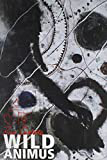

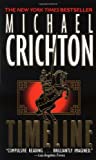

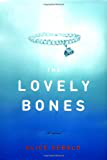

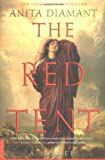

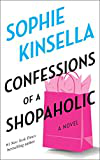

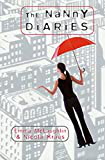

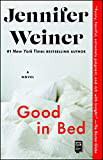

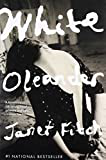

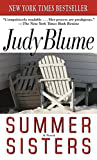

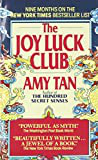

In [0]:
# Get image url of each recommendation
links = df_collaborative_books.join(book_recommendations_2, book_recommendations_2.value == df_collaborative_books.ISBN).select(col("Image-URL-M")).distinct()
 
# Print recommended book cover's
from PIL import Image
import requests
from io import BytesIO

for row in links.rdd.collect():
    #print(row['Image-URL-M'])
    try:
      response = requests.get(row['Image-URL-M'])
      image_bytes = BytesIO(response.content)
      img = Image.open(image_bytes)
      img.show()
    except Exception:
        pass  # or you could use 'continue'

In [0]:
# Get book recommendations for the new users
# User #2
user_id = [[1546486613]]
 
# Convert into a dataframe so that it can be passed into the recommendForUserSubset
functiondf = sc.parallelize(user_id).toDF(['User-ID'])
 
# Set number of recommendations
num_recommendations = 20
 
# See recomendations for user #2
recommendations = defaultModel.recommendForUserSubset(functiondf , num_recommendations)
recommendations.collect()
 
# Select only the ISBN of the books, ignore other fields
recommended_ISBN_2 = [recommendations.collect()[0]['recommendations'][x]['ISBN'] for x in range(0,num_recommendations)]
recommended_ISBN_2

Out[79]: [41,
 38,
 3,
 10,
 2,
 58,
 8,
 7,
 70,
 67,
 152,
 204,
 110,
 26,
 30,
 14,
 209,
 19,
 167,
 93]

In [0]:
# Convert the recommended_ISBN list into a dataframe so that it can be joined with the dataframe books_df
book_recommendations_2 = spark.createDataFrame(recommended_ISBN_2, IntegerType())

print('Top ', num_recommendations, ' book recommendations for User-ID ', user_id[0][0], ' are:')
 
#Show book title and book author of each recommendation
df_collaborative_books.join(book_recommendations_2, book_recommendations_2.value == df_collaborative_books.ISBN).select(col('Book-Title'),col('Book-Author')).distinct().show(num_recommendations, False)

Top  20  book recommendations for User-ID  1546486613  are:
+----------------------------------------------------------------+----------------------+
|Book-Title                                                      |Book-Author           |
+----------------------------------------------------------------+----------------------+
|Snow Falling On Cedars                                          |David Guterson        |
|Angels &amp; Demons                                             |Dan Brown             |
|Harry Potter And The Order Of The Phoenix (book 5)              |J. K. Rowling         |
|Fast Food Nation: The Dark Side Of The All-american Meal        |Eric Schlosser        |
|Outlander                                                       |Diana Gabaldon        |
|To Kill A Mockingbird                                           |Harper Lee            |
|Ender's Game (ender Wiggins Saga (paperback))                   |Orson Scott Card      |
|Harry Potter And The Chamber Of Secrets

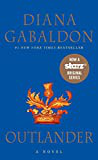

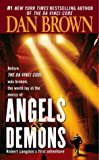

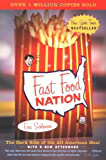

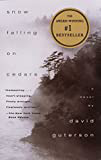

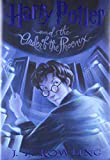

...

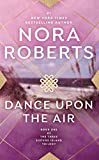

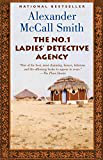

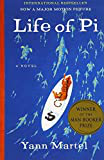

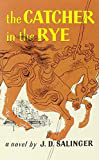

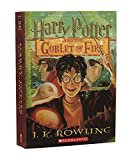

In [0]:
# Get image url of each recommendation
links = df_collaborative_books.join(book_recommendations_2, book_recommendations_2.value == df_collaborative_books.ISBN).select(col("Image-URL-M")).distinct()
 
# Print recommended book cover's
from PIL import Image
import requests
from io import BytesIO

for row in links.rdd.collect():
    #print(row['Image-URL-M'])
    try:
      response = requests.get(row['Image-URL-M'])
      image_bytes = BytesIO(response.content)
      img = Image.open(image_bytes)
      img.show()
    except Exception:
        pass  # or you could use 'continue'

In [0]:
# Save updated dataframe with new users information to .csv
# Select original dataframe with book title, book authors (without new isbn index column)
df_to_pass = df_collaborative.select(col("ISBN"),col("User-ID"),col("Book-Rating"),col("Book-Title"),col("Book-Author"))
 
#User 1 information with book title and book author
user1 = spark.createDataFrame(
  [('395071224', '1546486612', '10', 'The Hobbit', 'J. R. R. Tolkien'), 
   ('185326041X', '1546486612', '10', 'The Great Gatsby', 'F. Scott Fitzgerald'),
   ('590353403', '1546486612', '10', "Harry Potter and the Sorcerer's Stone (Book 1)", 'J. K. Rowling'), 
   ('62502174', '1546486612', '10', 'Into the Wild', 'Jon Krakauer'),  
   (' 0446310786', '1546486612', '10', 'The Alchemist: A Fable About Following Your Dream', 'Paulo Coelho'), 
   ('451524934', '1546486612', '10', '1984', 'George Orwell'), 
   ('60531045', '1546486612', '10', 'One Hundred Years of Solitude', 'Gabriel Garcia Marquez')],
 
  ["ISBN", "User-ID", "Book-Rating"])
 
#User 2 information with book title and book author
user2 = spark.createDataFrame(
  [('043935806X', '1546486613', '10','Harry potter and the order of the phoenix','J.k.Rowling'), 
    ('0316769487', '1546486613', '10','Catcher in the rye ','J. D. Salinger'),
     ('0345339703', '1546486613', '10','The Fellowship of the Ring (The Lord of the Rings, Part 1)','J. R. R. Tolkien'), 
     ('0345342968', '1546486613', '10','Fahrenheit 451','Ray Bradbury'),  
    (' 0446310786', '1546486613', '10','To Kill a Mockingbird','Harper Lee'), 
    (' 059035342X', '1546486613', '10',"Harry Potter and the Sorcerer's Stone",'J.k.Rowling'), 
    (' 0439064872', '1546486613', '10',"Harry Potter and the Chamber of Secrets",'J.k.Rowling') 
  ], 
 
  ["ISBN", "User-ID", "Book-Rating"])
 
# Join dataframe with new users information
users=[df_to_pass, user1, user2]
 
df_to_pass = reduce(DataFrame.unionAll, users)
 
# Create index for the ISBN column 
indexer =  StringIndexer(inputCol="ISBN", outputCol="ISBN_idx") 
transformed = indexer.fit(df_to_pass).transform(df_to_pass)
 
# Select desired columns
df_to_pass = transformed.select(col("ISBN_idx").alias("ISBN"),col("User-ID"),col("Book-Rating"),col("Book-Title"),col("Book-Author"))

# Check if it worked
df_to_pass.show(5)

+--------+-------+-----------+--------------------+----------------+
|    ISBN|User-ID|Book-Rating|          Book-Title|     Book-Author|
+--------+-------+-----------+--------------------+----------------+
|124494.0|  23902|          9|                Liar|     Stephen Fry|
|124498.0|  23902|          9|    The Fighting Man|  Gerald Seymour|
|124502.0|  23902|          0|Nothing Can Be Be...|Barns &amp; Budd|
|124512.0|  16319|          0|       Which Colour?|     Sue Dreamer|
|124515.0|  26583|          0|Huck Scarry's Ste...|     Huck Scarry|
+--------+-------+-----------+--------------------+----------------+
only showing top 5 rows



In [0]:
#Transform ISBN column to long type
last_df_changedType = df_to_pass.withColumn("ISBN", df_to_pass["ISBN"].cast(LongType()))
last_df_changedType.schema

Out[77]: StructType(List(StructField(ISBN,LongType,true),StructField(User-ID,StringType,true),StructField(Book-Rating,StringType,true),StructField(Book-Title,StringType,true),StructField(Book-Author,StringType,true)))

In [0]:
permanent_table_name = "ratings2"
last_df_changedType.write.format("csv").mode("overwrite").saveAsTable(permanent_table_name, header = 'true')

#### The End